In [1]:
import matplotlib
import matplotlib.dates as mdates

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.pyplot import figure
from mpl_toolkits import mplot3d
from sklearn.model_selection import (GridSearchCV, ShuffleSplit,
                                     train_test_split)
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.svm import SVR
from sklearn.inspection import permutation_importance


In [4]:

filepath = r'concrete_data.xls'
sheetname = 'obs'
#replace all_columns with individual dropdown values
X = pd.read_excel(filepath, sheet_name=sheetname, mangle_dupe_cols=True)
y= pd.read_excel(filepath, sheet_name='output',mangle_dupe_cols=True)
X_columns = ['Cement (component 1)(kg in a m^3 mixture)',
        'Blast Furnace Slag (component 2)(kg in a m^3 mixture)',
        'Fly Ash (component 3)(kg in a m^3 mixture)','Water  (component 4)(kg in a m^3 mixture)',
        'Superplasticizer (component 5)(kg in a m^3 mixture)', 'Coarse Aggregate  (component 6)(kg in a m^3 mixture)',	
        'Fine Aggregate (component 7)(kg in a m^3 mixture)', 'Age (day)']

y_column = ['Concrete compressive strength(MPa, megapascals) ']
X.head()
y.head()

,"Concrete compressive strength(MPa, megapascals)"
0,79.986111
1,61.887366
2,40.269535
3,41.052780
4,44.296075


In [5]:
y = y.round(4)
X = X.round(4)
df = pd.DataFrame()
#remove any trailing spaces in column names
X.columns = X.columns.str.strip()
y.columns = y.columns.str.strip()
X.columns = X.columns.str.replace("[^a-zA-Z\d\_]+", "")
y.columns = y.columns.str.replace("[^a-zA-Z\d\_]+", "")
#check if there are any columns of string type 
#(if so, trim and remove any special characters)
if X.columns[X.dtypes=='str'].dtype == 'str':
    X.columns[X.dtypes=='str'].data.str.strip()
else:
    print("No string datatypes in dataframe!")
if y.columns[y.dtypes=='str'].dtype == 'str':
    y.columns[y.dtypes=='str'].data.str.strip()
else:
    print("No string datatypes in dataframe!")

#look for any null/missing values 
X.isnull().values.any()
#may not need to chekc for nulls in y - it may be valid value
#y.isnull().values.any()

#scale/normalize the values for plotting features
X.columns = pd.io.parsers.ParserBase({'names':X.columns})._maybe_dedup_names(X.columns)
#X = X[X.T[X.any()].T.columns.values]
X = X[X.columns[(X != 0).any()] ]
y=pd.DataFrame(y.iloc[:,:],columns=y.columns.values)
standardy = StandardScaler()
standardX = StandardScaler()
scaled_y=standardy.fit_transform(y.values.reshape(-1,1))
scaled_X=standardX.fit_transform(X)
X.loc[:,:] = scaled_X
y.loc[:,:] = scaled_y
features = X.columns.values
response_column_name = y.columns.values[0]
df = pd.concat([X, y],  axis=1)
X = X
y = y
X = X.iloc[:, 0:]
print(type(X), type(y))

No string datatypes in dataframe!
No string datatypes in dataframe!
<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'>


In [6]:
X.describe()

,Cementcomponent1kginam3mixture,BlastFurnaceSlagcomponent2kginam3mixture,FlyAshcomponent3kginam3mixture,Watercomponent4kginam3mixture,Superplasticizercomponent5kginam3mixture,CoarseAggregatecomponent6kginam3mixture,FineAggregatecomponent7kginam3mixture,Ageday
count,1.030000e+03,1030.000000,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03,1.030000e+03
mean,9.657862e-17,0.000000,2.759389e-17,3.587206e-16,-2.759389e-17,2.276496e-16,-1.931572e-16,2.069542e-17
std,1.000486e+00,1.000486,1.000486e+00,1.000486e+00,1.000486e+00,1.000486e+00,1.000486e+00,1.000486e+00
min,-1.715219e+00,-0.856886,-8.471320e-01,-2.802333e+00,-1.038944e+00,-2.212137e+00,-2.240913e+00,-7.073594e-01
25%,-8.500258e-01,-0.856886,-8.471320e-01,-7.808013e-01,-1.038944e+00,-5.265140e-01,-5.319534e-01,-6.123314e-01
50%,-7.912996e-02,-0.601776,-8.471320e-01,1.608624e-01,2.460198e-02,-6.328926e-02,7.401267e-02,-2.797331e-01
75%,6.589771e-01,0.800751,1.001836e+00,4.888051e-01,6.627297e-01,7.267662e-01,6.291904e-01,1.637312e-01
max,2.477918e+00,3.310688,2.281122e+00,3.065497e+00,4.354156e+00,2.214232e+00,2.733101e+00,5.057677e+00


In [7]:
y.describe()

,ConcretecompressivestrengthMPamegapascals
count,1.030000e+03
mean,3.035328e-16
std,1.000486e+00
min,-2.005444e+00
25%,-7.252979e-01
50%,-8.234948e-02
75%,6.179621e-01
max,2.801687e+00


In [8]:
ss_data = ShuffleSplit(n_splits=10, train_size=0.5, test_size=.5,random_state=0)
target = pd.DataFrame(y.iloc[:, 0])
validation_y = target[-90:-1]
validation_X = X[-90:-1]
for train_index, test_index in ss_data.split(X):
    X_train, X_test = X[:len(train_index)], X[len(train_index): (len(train_index)+len(test_index))]
    y_train, y_test = target[:len(train_index)].values.ravel(), target[len(train_index): (len(train_index)+len(test_index))].values.ravel()

In [9]:
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV, BayesianRidge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn import model_selection

from sklearn.svm import SVC
from mpl_toolkits import mplot3d
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.exceptions import *

In [10]:
rmse = dict()
r2 = dict()
expvarscore = dict()

In [11]:
dt = DecisionTreeRegressor(random_state=0)

benchmark_dt=dt.fit(X_train, y_train)
#solutionmodels[constants_obj.BENCHMARK] = benchmark_dt
#plot the benchmark results

#joblib.dump(dt, folder_path+'benchmark_model.pkl')
#plot_benchmark_permutation_importance(benchmark_dt, X_train, y_train)

ss = model_selection.ShuffleSplit(n_splits=10, random_state=7)
lab_enc = preprocessing.LabelEncoder()
y_train_encoded = lab_enc.fit_transform(y_train)

cvresults = model_selection.cross_validate(benchmark_dt, X_train, 
                    y_train, cv=ss, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], n_jobs=5)
rmse["dtr"] = cvresults['test_neg_mean_squared_error'].tolist()
r2["dtr"] = cvresults['test_r2'].tolist()
expvarscore["dtr"] = cvresults['test_r2'].tolist()

ytrain_actual = standardy.inverse_transform(y_train)
#[:,0]
ytest_actual = standardy.inverse_transform(y_test)
#[:,0]
print(cvresults)

{'fit_time': array([0.00600219, 0.00599861, 0.00600219, 0.00600004, 0.00599861,
       0.00800085, 0.00699687, 0.00899911, 0.00999188, 0.01099992]), 'score_time': array([0.00300145, 0.00400019, 0.00400162, 0.00399852, 0.00300264,
       0.00499845, 0.00402784, 0.00299764, 0.00401282, 0.00300336]), 'test_neg_mean_squared_error': array([-0.13723308, -0.15377289, -0.26815004, -0.10830945, -0.24528851,
       -0.21303832, -0.19722521, -0.19705829, -0.24058549, -0.26515288]), 'test_explained_variance': array([0.82249228, 0.8428957 , 0.69501609, 0.91612969, 0.78715864,
       0.76818276, 0.83814568, 0.85181454, 0.7109307 , 0.76017317]), 'test_r2': array([0.8204117 , 0.83734238, 0.68516149, 0.91158988, 0.78636572,
       0.76602064, 0.83263715, 0.84339899, 0.71028536, 0.75826449])}


In [12]:
ypred_test = dt.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = dt.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
#print(ypred_train)

In [13]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

306.9930386186991 -0.6097498295269856


In [14]:
import dash
from dash import Dash
import dash_html_components as html
import dash_core_components as dcc
import dash_table

import pandas as pd

from flask import request
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import requests as req
from dash.dependencies import Input, Output
#import chart_studio.plotly.plotly as py
import plotly.offline as py
import numpy as np
import requests
import sys
import chart_studio.dashboard_objs as dashboard

In [15]:
def plot_result(ypred, y, title):
    fig = go.Figure()
    fig.add_trace( go.Scatter(
        x= y,
        y = ypred,
        mode='markers',
        marker=dict(
            size=10,
            color='black',
        )
    ))
    xrange=np.linspace(y.min(), y.max(), 100)
    yrange=np.linspace(ypred.min(), ypred.max(), 100)

    fig.add_trace(go.Scatter(x=xrange, y=yrange,
                    mode='lines',
                    name='lines',marker_color='blue'))
    fig.update_layout(
        title=title,
        xaxis_title="Observed",
        yaxis_title="Predicted",
        legend_title="Test Set",
        paper_bgcolor = 'rgb(251, 251, 251)',
        plot_bgcolor = 'rgb(251, 251, 251)',
        height=450, #width=1000, 
        margin=dict(
                l=50,
                r=20,
                b=100,
                t=100,
                pad=10
            ),
        xaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
        yaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
    )
    fig.show()

In [18]:
plot_result(ypred_test, y_test, y_column[0]+": Decision Tree Regression on Test set")

In [19]:
import json
from json import JSONEncoder
from collections import namedtuple
from reg import model_parameters
def model_params_decoder(obj):
    if '__type__' in obj and obj['__type__'] == 'ModelParameters':
        return model_parameters.ModelParameters(obj['svr_params_obj'], obj['rfr_params_obj'], obj['lasso_params_obj'], obj['br_params_obj'])
    return obj
with open('fixtures\params.json') as f:
    model_params_obj = json.load(f, object_hook=model_params_decoder)
print(model_params_obj.rfr_params_obj)

In [20]:
type= 'linear'
lin_svr = SVR(kernel=type)

svr_feat = lin_svr.fit(X_train, y_train)

#hyperparameter tuning using GridSearch CV
lin_svr_parameters = {
    'C': model_params_obj.svr_params_obj.svr_list_c,
    'epsilon':model_params_obj.svr_params_obj.svr_list_espilon,
    }
lin_gridsearch_svr_feat = GridSearchCV(estimator=svr_feat, 
param_grid=lin_svr_parameters, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=ss_data, n_jobs=5,refit='neg_mean_squared_error')

lin_gridsearch_svr_feat.fit(X_train, y_train)
#plot the scores
#plot_svr_permutation_importance(lin_gridsearch_svr_feat, X_train, y_train)

rmse["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_r2'].tolist()
expvarscore["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_explained_variance'].tolist()


In [21]:
ypred_test = lin_gridsearch_svr_feat.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = lin_gridsearch_svr_feat.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
#print(ypred_train)

In [22]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

105.50317813939259 0.4467831460003088


In [23]:
plot_result(ypred_test, y_test,  y_column[0]+": Support Vector Regression on Test set")

In [24]:
rfr = RandomForestRegressor(n_estimators=50, random_state=0)
rfr_feat = rfr.fit(X_train, y_train)

#hyperparameter tuning using GridSearch CV
rfr_parameters = {
    'n_estimators': model_params_obj.rfr_params_obj.rfr_list_n_estimators,
    'max_features': model_params_obj.rfr_params_obj.rfr_max_features,
    'max_depth': model_params_obj.rfr_params_obj.rfr_max_depth,
    }
rfr_gridsearch_feat = GridSearchCV(estimator=rfr_feat, 
param_grid=rfr_parameters, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=ss_data, n_jobs=5, refit='neg_mean_squared_error')

rfr_gridsearch_feat.fit(X_train, y_train)
#plot the scores
#plot_rfr_permutation_importance(rfr_gridsearch_feat, _X_train, _y_train)

rmse["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_r2'].tolist()
expvarscore["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_explained_variance'].tolist()


In [25]:
ypred_test = rfr_gridsearch_feat.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = rfr_gridsearch_feat.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
#print(ypred_train)

In [26]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

200.5673584889681 -0.05169574068846172


In [27]:
plot_result(ypred_test, y_test,  y_column[0]+": Random Forest Regression on Test set")

In [28]:
alphas = np.logspace(model_params_obj.lasso_params_obj.minAlpha, model_params_obj.lasso_params_obj.maxAlpha,
num=model_params_obj.lasso_params_obj.lasso_n_alphas,base=np.e)
print('alphas', alphas)
lasso = Lasso(max_iter=model_params_obj.lasso_params_obj.lasso_max_iter, normalize=False, fit_intercept=True)
#initialize scores for each alpha
scores = np.empty_like(alphas)
weights = []
for i,a in enumerate(alphas):
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    weights.append(lasso.coef_)
    #add scores for each alpha
    scores[i] = lasso.score(X_train, y_train)
print('r-2',scores)
tuned_parameters = [{'alpha': alphas}]
n_folds = 6
gridsearch_lasso_cv = GridSearchCV(lasso, tuned_parameters, 
scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=n_folds, refit='neg_mean_squared_error')

gridsearch_lasso_cv.fit(X_train, y_train)

#plot_lasso_permutation_importance(gridsearch_lasso_cv, _X_train, _y_train)

rmse["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_r2'].tolist()
expvarscore["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_explained_variance'].tolist()


alphas [4.53999298e-05 4.54521749e-05 4.55044802e-05 ... 4.47139200e+00
 4.47653758e+00 4.48168907e+00]
r-2 [0.53158606 0.53158606 0.53158606 ... 0.         0.         0.        ]


In [36]:
ypred_test = gridsearch_lasso_cv.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = gridsearch_lasso_cv.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
#print(ypred_train)

In [37]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

276.6597878682295 -0.45069428401927225


In [38]:
plot_result(ypred_test, y_test,  y_column[0]+": Lasso Regression on Test set")

In [39]:
def weight_vs_alpha_plot(weights, alphas, scores, features, is_save):
    """
    Pass in the estimated weight, the alpha value and the names
    for the features and plot the model's estimated coefficient weight 
    for different alpha values
    """
    fig = plt.figure(figsize = (8, 6))

    # ensure that the weight is an array
    weight = np.array(weights)
    for col in range(weight.shape[1]):
        #print(weight[:, col])
        plt.plot(np.log(alphas), weight[:, col], label = features[col])

    plt.axhline(0, color = 'black', linestyle = '--', linewidth = 3)

    # manually specify the coordinate of the legend
    plt.legend(bbox_to_anchor = (1.3, 0.9))
    plt.title('Coefficient Weight as Alpha Grows')
    plt.ylabel('Coefficient weight')
    plt.xlabel('alpha')
    fig.show()

    fig2 = plt.figure(figsize = (8, 6))
    plt.plot(alphas, scores, '-ko')
    plt.xlabel('log '+r'$\alpha$')
    plt.ylabel('R-2')
    plt.xscale('log')
    plt.title('Pre-parameter-tuning R-2 scores for alphas')
    sns.despine(offset=15)
    fig2.show()

In [40]:
def weights_vs_alphas(weights, alphas, features):
    figure = go.Figure()
    weight = np.array(weights)
    z = np.zeros((1000,))
    weight = np.array(weights)
    for column in range(weight.shape[1]):
        figure.add_trace(go.Scatter(x=np.log(alphas),
            y=weight[:,column],
            name=features[column], line=dict(width=3)
        ))
    figure.update_yaxes(
        ticktext=[features],
    )
    figure.add_trace(go.Scatter(x=alphas,y=z,
                            line = dict(color='black', width=3, dash='dash'), 
                            name="axis line"))
    figure.update_traces(hoverinfo='text+name', mode='lines')

    figure.update_layout(xaxis_showgrid=False, yaxis_showgrid=False,
    title_text="LASSO : Coefficient Weight as Alpha Grows", xaxis_title='alpha',
               yaxis_title='coefficient weights')
    figure.show()

<ipython-input-39-1709e0983c18>:22: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

<ipython-input-39-1709e0983c18>:31: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



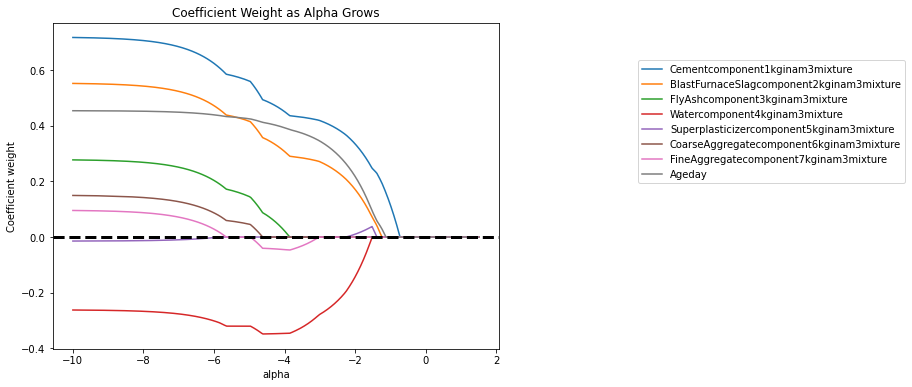

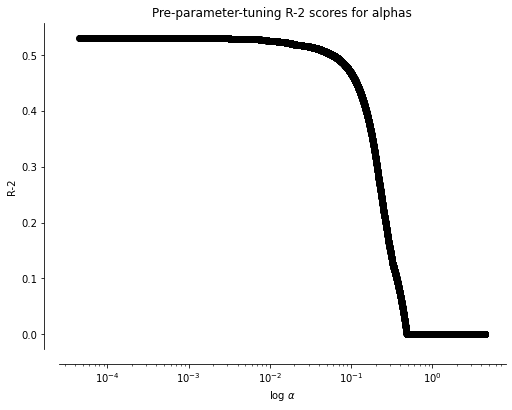

In [41]:
weight_vs_alpha_plot(weights, alphas, scores, features, True)

In [42]:
weights_vs_alphas(weights, alphas, features)

In [43]:
bay_ridge = BayesianRidge()
bay_feat = bay_ridge.fit(X_train, y_train)

#plot the scores
#plot_br_permutation_importance(bay_feat, _X_train, _y_train)

ss = model_selection.ShuffleSplit(n_splits=10, random_state=7)

cv_results = model_selection.cross_validate(bay_feat, X_train, 
                    y_train, cv=ss, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], n_jobs=5)

rmse["br"] = cv_results['test_neg_mean_squared_error'].tolist()
r2["br"] = cv_results['test_r2'].tolist()
expvarscore["br"] = cv_results['test_explained_variance'].tolist()

In [44]:
ypred_test = bay_ridge.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = bay_ridge.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
#print(ypred_train)

In [45]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

105.09166306028933 0.44894096798680994


In [46]:
plot_result(ypred_test, y_test,  y_column[0]+": Lasso Regression on Test set")

In [47]:
def plot_perm_importances( features, importances, plot_details : list):
        title, algorithm = plot_details
        fig = go.Figure()
        for name, result in zip( features, importances):
                fig.add_trace(go.Box(x=result, name=name, orientation='h'))
        fig.update_layout(title_text="Permutation Importances for "+ title,
                paper_bgcolor = 'rgb(251, 251, 251)',
                plot_bgcolor = 'rgb(251, 251, 251)',
                height=450, #width=1000, 
                margin=dict(
                        l=50,
                        r=20,
                        b=100,
                        t=100,
                        pad=10
                    ),
                xaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
                yaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
                )
        fig.show()

In [48]:
from sklearn.inspection import permutation_importance
import os
features = X_train.columns.values
result = permutation_importance(benchmark_dt, X_train, y_train, n_repeats=10,
                                random_state=42)
perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(benchmark_dt.feature_importances_)
tree_indices = np.arange(0, len(benchmark_dt.feature_importances_)) + 0.5

#print(perm_sorted_idx,tree_importance_sorted_idx )
plot_perm_importances(features[perm_sorted_idx].tolist(), result.importances[perm_sorted_idx].T, [
    "Decision Tree Regression", "dtr"])

In [49]:
features = X_train.columns.values
result_lasso = permutation_importance(gridsearch_lasso_cv, X_train, y_train, n_repeats=10,
                        random_state=42)
perm_sorted_idx = result_lasso.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(gridsearch_lasso_cv.best_estimator_.coef_)
tree_indices = np.arange(0, len(gridsearch_lasso_cv.best_estimator_.coef_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )

plot_perm_importances(features[perm_sorted_idx].tolist(), result_lasso.importances[perm_sorted_idx].T,[
    "Lasso Regression", "svr"])


[2 3 5 6 4 1 7 0] [2 3 5 6 4 1 7 0]


In [50]:
algorithms = {'dtr':'Decision Tree Regression', 'svr': 'Support Vector Regression', 
              'rfr':'Random Forest Regression', 'lr':'Lasso Regression', 'br':'Bayesian Ridge Regression'}
def plot_algorithm_comparison(results, scoring_name):
    # boxplot algorithm comparison
    fig = go.Figure()
    for name, result in results.items():
        fig.add_trace(go.Box(y=result, name=algorithms[name]))
    fig.update_layout(title_text=scoring_name+" : Algorithm comparison")
    fig.show()

In [51]:

plot_algorithm_comparison(rmse, "RMSE")
plot_algorithm_comparison(r2, "R^2")
plot_algorithm_comparison(expvarscore, "Explained Variance")


In [52]:
features = X_train.columns.values
result_rfr = permutation_importance(rfr_gridsearch_feat, X_train, y_train, n_repeats=10,
                            random_state=42)
perm_sorted_idx = result_rfr.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(rfr_gridsearch_feat.best_estimator_.feature_importances_)
tree_indices = np.arange(0, len(rfr_gridsearch_feat.best_estimator_.feature_importances_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )

plot_perm_importances(features[perm_sorted_idx].tolist(), result_rfr.importances[perm_sorted_idx].T,[
"Random Forest Regression", "rfr"])

[2 5 6 3 1 4 0 7] [2 6 5 1 3 4 0 7]


In [53]:
features = X_train.columns.values
result_br = permutation_importance(bay_feat, X_train, y_train, n_repeats=10,
                            random_state=42)
perm_sorted_idx = result_br.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(bay_feat.coef_)
tree_indices = np.arange(0, len(bay_feat.coef_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )
plot_perm_importances(features[perm_sorted_idx].tolist(), result_br.importances[perm_sorted_idx].T,[
"Bayesian Ridge Regression", "svr"])

[4 6 5 2 3 1 7 0] [3 4 6 5 2 7 1 0]
